In [23]:
from lib import Augmentation_methods
from lib import data_preparation

In [24]:
# All used imports
import numpy as np
import pandas as pd
import pathlib
import matplotlib.pyplot as plt

from lib import Augmentation_methods

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.losses import SparseCategoricalCrossentropy

from IPython.display import clear_output

from scipy.signal import stft

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


from pathlib import Path
import datetime
import glob as gl

## Real Data [206 B5]

In [25]:
df_real_data = data_preparation.load_real_data(room="206 B5",year=2022, month=10, day=14, startHour=18,lastHour=18)
df_real_data

5691390 rows from filepath: 2022-10-14_18-00-00


,z,time
0,-32,2022-10-14 18:00:00.000000
1,-32,2022-10-14 18:00:00.000625
2,-32,2022-10-14 18:00:00.001250
3,-32,2022-10-14 18:00:00.001875
4,-32,2022-10-14 18:00:00.002500
...,...,...
5691385,1020,2022-10-14 18:59:17.115625
5691386,1018,2022-10-14 18:59:17.116250
5691387,1018,2022-10-14 18:59:17.116875
5691388,1016,2022-10-14 18:59:17.117500


In [26]:
df_segmented = data_preparation.shifting_window_segmentation(df_real_data,stepsize= 5)
df_segmented

,left_t,right_t,z,features
0,2022-10-14 18:00:00,2022-10-14 18:00:10,"[-32, -32, -32, -32, -32, -32, -32, 1018, 1016...","[[1103660.6865753164, 2.0950753164061866, 485...."
1,2022-10-14 18:00:05,2022-10-14 18:00:15,"[1018, 1020, 1019, 1020, 1020, 1022, 1020, 101...","[[49.19619600000014, 1.0281960000000203, 2.876..."
2,2022-10-14 18:00:10,2022-10-14 18:00:20,"[1018, 1020, 1022, 1019, 1020, 1022, 1016, 102...","[[1104439.4146597658, 1.1596597656249412, 71.9..."
3,2022-10-14 18:00:15,2022-10-14 18:00:25,"[1016, 1018, 1019, 1016, 1020, 1017, 1021, 102...","[[2384055.275491891, 1.078741890625051, 462.74..."
4,2022-10-14 18:00:20,2022-10-14 18:00:30,"[1016, 1018, 1018, 1018, 1020, 1019, 1016, 101...","[[2384469.4818425626, 1.3753425624998847, 978...."
...,...,...,...,...
705,2022-10-14 18:58:45,2022-10-14 18:58:55,"[1018, 1017, 1020, 1020, 1018, 1017, 1021, 102...","[[51.65656256249927, 1.409562562499879, 3.0019..."
706,2022-10-14 18:58:50,2022-10-14 18:59:00,"[1018, 1020, 1018, 1018, 1020, 1020, 1020, 101...","[[1658359.4605006287, 1.5053756289061584, 106...."
707,2022-10-14 18:58:55,2022-10-14 18:59:05,"[1018, 1018, 1018, 1018, 1018, 1020, 1018, 102...","[[1658385.8599534726, 1.4803284726563342, 106...."
708,2022-10-14 18:59:00,2022-10-14 18:59:10,"[1018, 1018, 1020, 1018, 1020, 1020, 1020, 102...","[[50.72110351562565, 1.258603515625102, 3.0003..."


In [27]:
# df_segmented_real= df_segmented[(df_segmented['left_t'] >= '2022-10-14 18:43:00') & (df_segmented['right_t'] <= '2022-10-14 18:46:00')]
# df_segmented_real

In [28]:
Real_Events = []
for i in range(len(df_segmented)):
    Real_Events.append(df_segmented["features"].iloc[i].flatten())

In [ ]:
Real_Events

# 1. Logistische Regression

### Training

In [30]:
fake_data,All_Events,All_Labels = data_preparation.fake_lab_data()

/home/ing2146/Final/SNEHA/lib/data_preparation.py:202: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  All_Events_Data = np.array(All_Events_Data)[shuffler]
/home/ing2146/Final/SNEHA/lib/data_preparation.py:226: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  df_fake_dummy_Data = np.array(df_fake_dummy_Data)


In [31]:
x = All_Events
y = All_Labels

In [32]:
x_train, x_test, y_train, y_test = train_test_split(x, y.ravel(), test_size=0.2)
lr = LogisticRegression(max_iter=1000).fit(x_train, y_train)
pd.crosstab(lr.predict(x_test), y_test)

col_0,0,1
row_0,,
0,3999,0
1,0,217


In [33]:
prediction = lr.predict(Real_Events)


In [34]:
 len(prediction[prediction == 1])

263

In [35]:
df_segmented["predicted"] = prediction

In [36]:
df_segmented

,left_t,right_t,z,features,predicted
0,2022-10-14 18:00:00,2022-10-14 18:00:10,"[-32, -32, -32, -32, -32, -32, -32, 1018, 1016...","[[1103660.6865753164, 2.0950753164061866, 485....",1
1,2022-10-14 18:00:05,2022-10-14 18:00:15,"[1018, 1020, 1019, 1020, 1020, 1022, 1020, 101...","[[49.19619600000014, 1.0281960000000203, 2.876...",0
2,2022-10-14 18:00:10,2022-10-14 18:00:20,"[1018, 1020, 1022, 1019, 1020, 1022, 1016, 102...","[[1104439.4146597658, 1.1596597656249412, 71.9...",1
3,2022-10-14 18:00:15,2022-10-14 18:00:25,"[1016, 1018, 1019, 1016, 1020, 1017, 1021, 102...","[[2384055.275491891, 1.078741890625051, 462.74...",1
4,2022-10-14 18:00:20,2022-10-14 18:00:30,"[1016, 1018, 1018, 1018, 1020, 1019, 1016, 101...","[[2384469.4818425626, 1.3753425624998847, 978....",1
...,...,...,...,...,...
705,2022-10-14 18:58:45,2022-10-14 18:58:55,"[1018, 1017, 1020, 1020, 1018, 1017, 1021, 102...","[[51.65656256249927, 1.409562562499879, 3.0019...",0
706,2022-10-14 18:58:50,2022-10-14 18:59:00,"[1018, 1020, 1018, 1018, 1020, 1020, 1020, 101...","[[1658359.4605006287, 1.5053756289061584, 106....",1
707,2022-10-14 18:58:55,2022-10-14 18:59:05,"[1018, 1018, 1018, 1018, 1018, 1020, 1018, 102...","[[1658385.8599534726, 1.4803284726563342, 106....",1
708,2022-10-14 18:59:00,2022-10-14 18:59:10,"[1018, 1018, 1020, 1018, 1020, 1020, 1020, 102...","[[50.72110351562565, 1.258603515625102, 3.0003...",0


/home/ing2146/Final/SNEHA/lib/data_preparation.py:275: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, sharex=False, figsize=(8, 5))


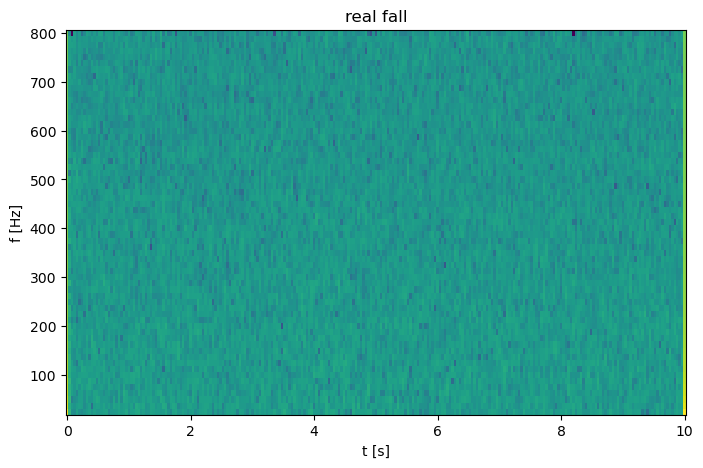

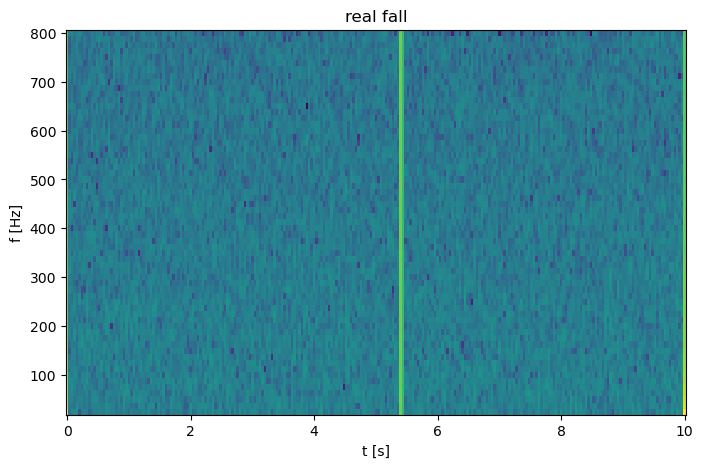

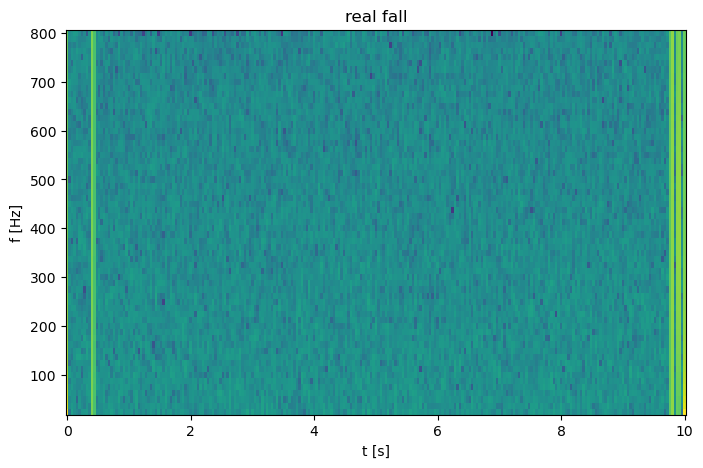

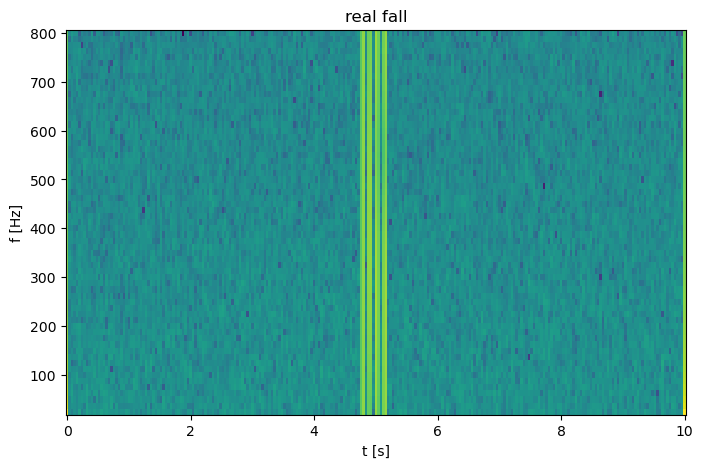

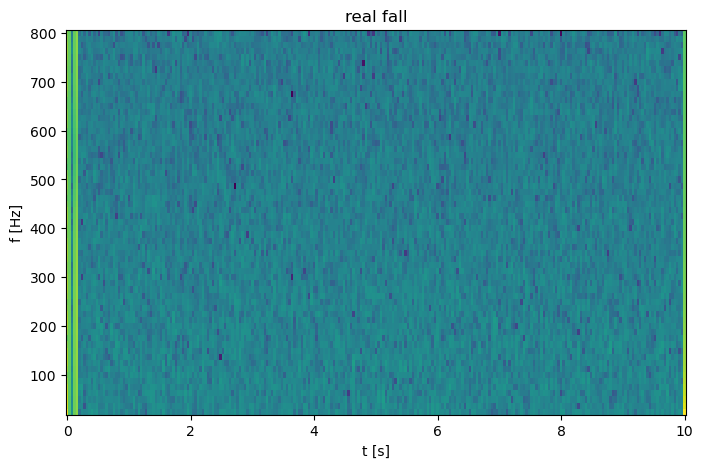

...

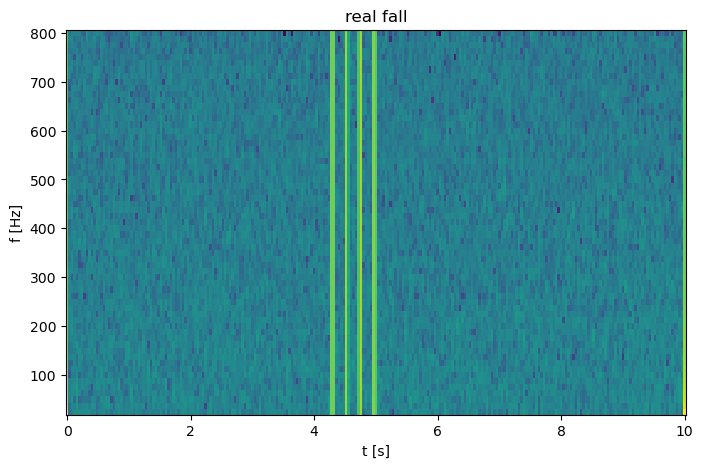

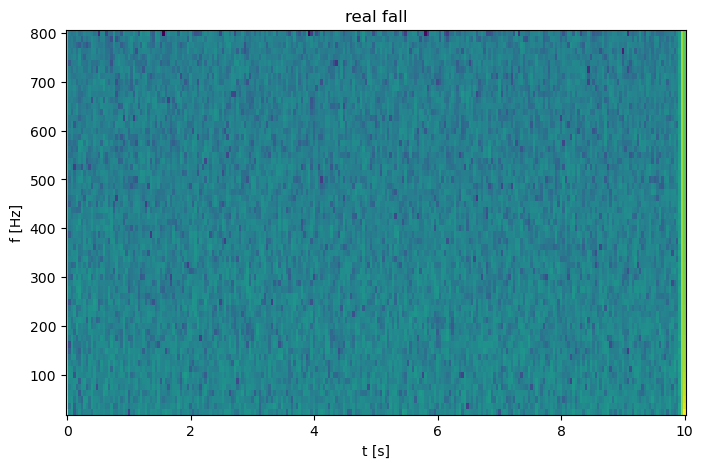

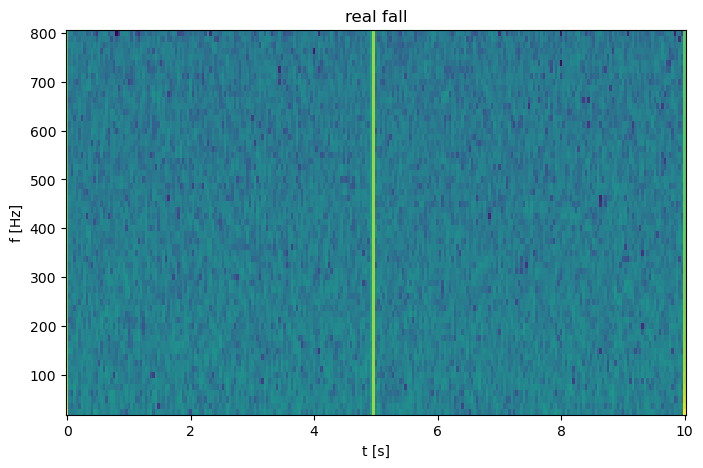

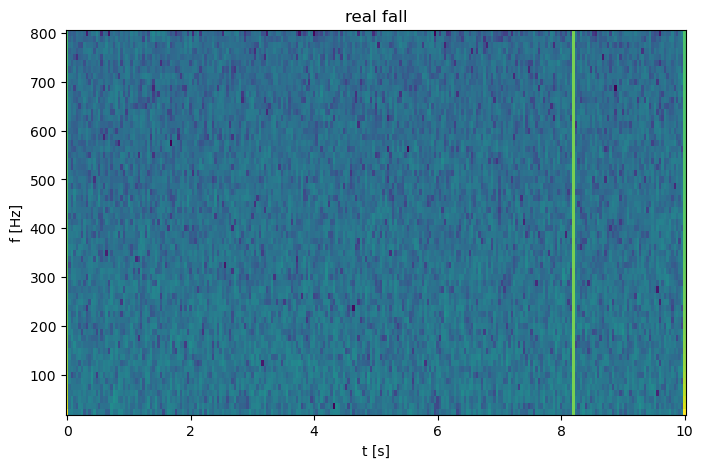

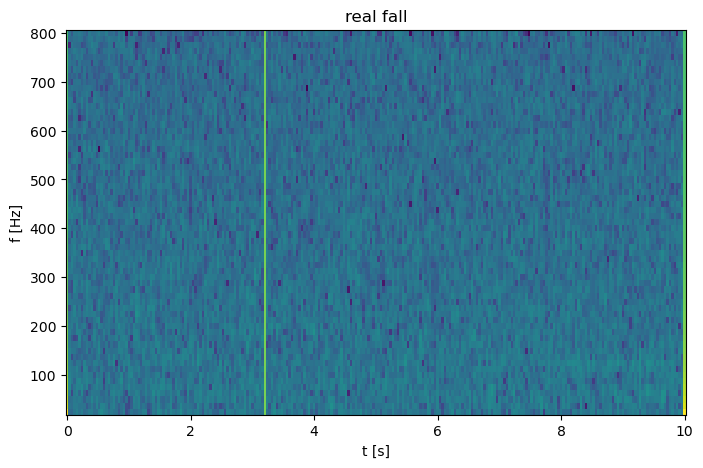

In [37]:
for i, event in enumerate(Real_Events):
    if ((df_segmented['predicted'].iloc[i]) == 1):
            data_preparation.stft_plot(label = "real fall" , data = df_segmented['z'].iloc[i])
    else:
        continue
    